# UNet_2DCNN based End-to-End MultiClass Satellite Image Segmentation Pipeline

# Test GPU (Optional)
Before Starting, kindly check the available GPU from the Google Server, GPU model and other related information. It might help!

In [1]:
import torch
print("Is CUDA enabled GPU Available?", torch.cuda.is_available())
print("GPU Number:", torch.cuda.device_count())
print("Current GPU Index:", torch.cuda.current_device())
print("GPU Type:", torch.cuda.get_device_name(device=None))
print("GPU Capability:", torch.cuda.get_device_capability(device=None))
print("Is GPU Initialized yet?", torch.cuda.is_initialized())

Is CUDA enabled GPU Available? True
GPU Number: 1
Current GPU Index: 0
GPU Type: Tesla P100-PCIE-16GB
GPU Capability: (6, 0)
Is GPU Initialized yet? True


# Connect to Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/GDrive')

Mounted at /content/GDrive


Move to the Target Directory

In [3]:
%cd /content/GDrive/MyDrive/Colab_Notebooks/Omdena

/content/GDrive/MyDrive/Colab_Notebooks/Omdena


List the Files and Folders Located in the Current Directory

In [4]:
!ls

checkpoint	results				      train_geojson_v3
Data		sample_submission.csv		      train_wkt_v4.csv
grid_sizes.csv	Sentinel2			      train_wkt_v4.gsheet
Labels.csv	sentinel_data			      UNet_2DCNN.py
mask.png	sixteen_band			      weights
Polygons.txt	task-4-end-to-end-CNN-pipeline.ipynb
pred_masks	three_band


Upload Files from Local Drive

In [ ]:
from google.colab import files
uploaded = files.upload()

# Import Necessary Libraries

In [5]:
import os
import cv2
import math
import random
import numpy as np
import pandas as pd
import tifffile as tiff
import shapely.wkt
import shapely.affinity
import matplotlib.pyplot as plt
from shapely.wkt import loads as wkt_loads
from shapely.geometry import MultiPolygon, Polygon
from collections import defaultdict
from keras import backend as K
from keras.models import Model, model_from_json
from keras.layers import Input, merge, Conv2D, MaxPooling2D, UpSampling2D, Reshape, core, Dropout
from keras.layers import concatenate, BatchNormalization, Activation, add, Flatten, Dense
from keras.callbacks import EarlyStopping, ModelCheckpoint, LearningRateScheduler
from sklearn.metrics import jaccard_similarity_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

In [6]:
from UNet_2DCNN import * 

# End-to-End Data Pre-processing and Segmentation Pipeline

Note: Codes extracted from "Kaggle DSTL Challenge Code Repository" was all written in KERAS with Theano backend. So many code blocks provided errors for Keras with the Tensorflow backend especaiily due to 'channel_first_or_last' axis related issue. It has been fixed in this pipeline to make the codes suitable for Tensorflow-Keras (no longer supported Theano backend now).

## Import Files





In [ ]:
%cd /content # Move to the root directory

Unzip ZIP Files if the Datasets are available in ZIP Format

In [ ]:
!jar xvf three_band.zip
!jar xvf sixteen_band.zip
!jar xvf train_geojson_v3.zip

Download data directly from these Google Drive links 

(These Links can be temporary as the files might be removed after the challenge due to their huge size. Moreover this is personal GDrive account.)

In [ ]:
!gdown --id 1uFajX9S0RDfPtT1CDIag3X27SlBrKLJb # Three Band (RGB) Image Folder
!gdown --id 1TAY-jc3_IOdvgDRJRr4p-OmCOk03_f5M # Sixteen Band Image Folder
!gdown --id 1--5kRoGAwbxwrAiB418NsbUNAZRHIYzr # CSV File containing Grid Size
!gdown --id 1-5QqhaKBpBkwNHstao_li_Ong796oDhm # Train WKT (Multipolygon) CSV File
!gdown --id 1-1nER7Lpfbj7EloPLnqjDunFEnnjFkql # Sample Submission CSV File for the Challenge
!gdown --id 10Mvs-DVz3RBnaCbXMcTcDu5yl71hDrx3 # UNet and its Variants' 2D Segmentation Code
#
'''GitHub Link for the UNet_2D Segmentation Code (Author: Sakib Mahmud)
https://github.com/Sakib1263/UNet2D-Segmentation-Model-Builder-KERAS'''

## Prepare Dataset

DSTL Dataset Link: https://www.kaggle.com/c/dstl-satellite-imagery-feature-detection/data

'''
DSTL has labeled 10 different classes:
1. Buildings - large building, residential, non-residential, fuel storage facility, fortified building
2. Misc. Manmade structures 
3. Road
4. Track - poor/dirt/cart track, footpath/trail
5. Trees - woodland, hedgerows, groups of trees, standalone trees
6. Crops - contour ploughing/cropland, grain (wheat) crops, row (potatoes, turnips) crops
7. Waterway
8. Standing water
9. Vehicle Large - large vehicle (e.g. lorry, truck,bus), logistics vehicle
10. Vehicle Small - small vehicle (car, van), motorbike
'''

Import MetaData

In [15]:
DF = pd.read_csv('train_wkt_v4.csv')
GS = pd.read_csv('grid_sizes.csv', names=['ImageId', 'Xmax', 'Ymin'], skiprows=1)
SB = pd.read_csv(os.path.join('sample_submission.csv'))

In [16]:
DF.head(11)

,ImageId,ClassType,MultipolygonWKT
0,6040_2_2,1,MULTIPOLYGON EMPTY
1,6040_2_2,2,MULTIPOLYGON EMPTY
2,6040_2_2,3,MULTIPOLYGON EMPTY
3,6040_2_2,4,MULTIPOLYGON (((0.003025 -0.007879000000000001...
4,6040_2_2,5,MULTIPOLYGON (((0.005311 -0.009044999999999999...
5,6040_2_2,6,MULTIPOLYGON EMPTY
6,6040_2_2,7,MULTIPOLYGON EMPTY
7,6040_2_2,8,MULTIPOLYGON EMPTY
8,6040_2_2,9,MULTIPOLYGON EMPTY
9,6040_2_2,10,MULTIPOLYGON EMPTY


In [17]:
GS.head()

,ImageId,Xmax,Ymin
0,6120_2_4,0.009180,-0.00904
1,6120_2_3,0.009169,-0.00904
2,6120_2_2,0.009188,-0.00904
3,6120_2_1,0.009188,-0.00904
4,6120_2_0,0.009188,-0.00904


In [18]:
x = DF['ImageId'].nunique()
print(f'Number of Labelled Images = {x}')

Number of Labelled Images = 25


## Declare Global Variables

In [19]:
N_Cls = DF['ClassType'].nunique() # Number of Classes = 10
IMSIZE = 512 # Resized Image Size for Training
ISZ = 128    # Patch Size while Training
smooth = 1e-12

In [20]:
print(f'Total Number of Classes= {N_Cls}')
print(f'Total Number of Patches per Image= {math.floor(np.square(IMSIZE/ISZ)):.0f}')

Total Number of Classes= 10
Total Number of Patches per Image= 16


## Generate Masks from Images

In [21]:
# __author__ = visoft
# https://www.kaggle.com/visoft/dstl-satellite-imagery-feature-detection/export-pixel-wise-mask
# Modified and Improved by: Sakib Mahmud

def _convert_coordinates_to_raster(coords, img_size, xymax):
    Xmax, Ymax = xymax
    H, W = img_size
    W1 = 1.0 * W * W / (W + 1)
    H1 = 1.0 * H * H / (H + 1)
    xf = W1 / Xmax
    yf = H1 / Ymax
    coords[:, 1] *= yf
    coords[:, 0] *= xf
    coords_int = np.round(coords).astype(np.int32)
    return coords_int


def _get_xmax_ymin(grid_sizes_panda, imageId):
    xmax, ymin = grid_sizes_panda[grid_sizes_panda.ImageId == imageId].iloc[0, 1:].astype(float)
    return (xmax, ymin)


def _get_polygon_list(wkt_list_pandas, imageId, cType):
    df_image = wkt_list_pandas[wkt_list_pandas.ImageId == imageId]
    multipoly_def = df_image[df_image.ClassType == cType].MultipolygonWKT
    polygonList = None
    if len(multipoly_def) > 0:
        # assert len(multipoly_def) == 1
        polygonList = wkt_loads(multipoly_def.values[0])
    return polygonList


def _get_and_convert_contours(polygonList, raster_img_size, xymax):
    perim_list = []
    interior_list = []
    if polygonList is None:
        return None
    for k in range(len(polygonList)):
        poly = polygonList[k]
        perim = np.array(list(poly.exterior.coords))
        perim_c = _convert_coordinates_to_raster(perim, raster_img_size, xymax)
        perim_list.append(perim_c)
        for pi in poly.interiors:
            interior = np.array(list(pi.coords))
            interior_c = _convert_coordinates_to_raster(interior, raster_img_size, xymax)
            interior_list.append(interior_c)
    return perim_list, interior_list


def _plot_mask_from_contours(raster_img_size, contours, class_value=1):
    img_mask = np.zeros(raster_img_size, np.uint8)
    if contours is None:
        return img_mask
    perim_list, interior_list = contours
    cv2.fillPoly(img_mask, perim_list, class_value)
    cv2.fillPoly(img_mask, interior_list, 0)
    return img_mask


def generate_mask_for_image_and_class(raster_size, imageId, class_type, grid_sizes_panda=GS, wkt_list_pandas=DF):
    xymax = _get_xmax_ymin(grid_sizes_panda, imageId)
    polygon_list = _get_polygon_list(wkt_list_pandas, imageId, class_type)
    contours = _get_and_convert_contours(polygon_list, raster_size, xymax)
    mask = _plot_mask_from_contours(raster_size, contours, 1)
    return mask

Combine all 17 Channels (8 + 8 + 1) or use only 3 RGB Channels (Optional to the 8 Channel approach)  
Note: More channels will utilize more RAM during training.

In [ ]:
'''Num_Channel = 17
def combine_image_channels(image_id):
    filename_M = os.path.join('sixteen_band', '{}_M.tif'.format(image_id))
    img_M = tiff.imread(filename_M)
    img_M2 = np.rollaxis(img_M, 0, 3)
    # print(img_M2.shape)
    img_M2_resize = cv2.resize(img_M2, (IMSIZE, IMSIZE)) 

    filename_A = os.path.join('sixteen_band', '{}_A.tif'.format(image_id))
    img_A = tiff.imread(filename_A)
    img_A2 = np.rollaxis(img_A, 0, 3)
    # print(img_A2.shape)
    img_A2_resize = cv2.resize(img_A2, (IMSIZE, IMSIZE)) 

    filename_P = os.path.join('sixteen_band', '{}_P.tif'.format(image_id))
    img_P2 = tiff.imread(filename_P)
    # print(img_P2.shape)
    img_P2_resize = cv2.resize(img_P2, (IMSIZE, IMSIZE)) 

    Array = np.zeros((img_M2_resize.shape[0],img_M2_resize.shape[1],Num_Channel), 'uint8')
    Array[..., 0] = img_P2_resize
    Array[..., 1:9] = img_M2_resize
    Array[..., 9:17] = img_A2_resize

    return Array'''

'''Num_Channel = 3
def combine_image_channels(image_id):
    filename_RGB = os.path.join('three_band', '{}.tif'.format(image_id))
    img_RGB = tiff.imread(filename_RGB)
    img_RGB2 = np.rollaxis(img_RGB, 0, 3)
    # print(img_RGB2.shape)
    img_RGB2_resize = cv2.resize(img_RGB2, (IMSIZE, IMSIZE)) 

    return img_RGB2_resize'''

8 Channel Multispectral

In [24]:
Num_Channel = 8
def combine_image_channels(image_id):
    filename_M = os.path.join('sixteen_band', '{}_M.tif'.format(image_id))
    img_M = tiff.imread(filename_M)
    img_M2 = np.rollaxis(img_M, 0, 3)
    # print(img_M2.shape)
    img_M2_resize = cv2.resize(img_M2, (IMSIZE, IMSIZE)) 

    return img_M2_resize

In [25]:
def stretch_n(bands, lower_percent=5, higher_percent=98):
    # out = np.zeros_like(bands)
    out = np.zeros_like(bands).astype(np.float32)
    n = bands.shape[2]
    for i in range(n):
        a = 0  # np.min(band)
        b = 1  # np.max(band)
        c = np.percentile(bands[:, :, i], lower_percent)
        d = np.percentile(bands[:, :, i], higher_percent)
        t = a + (bands[:, :, i] - c) * (b - a) / (d - c)
        t[t < a] = a
        t[t > b] = b
        out[:, :, i] = t

    return out.astype(np.float32)

### Visualize Labelled Images with Each Class Ground Truth Masks

Applicable only for the Training set which has Ground Truth masks available

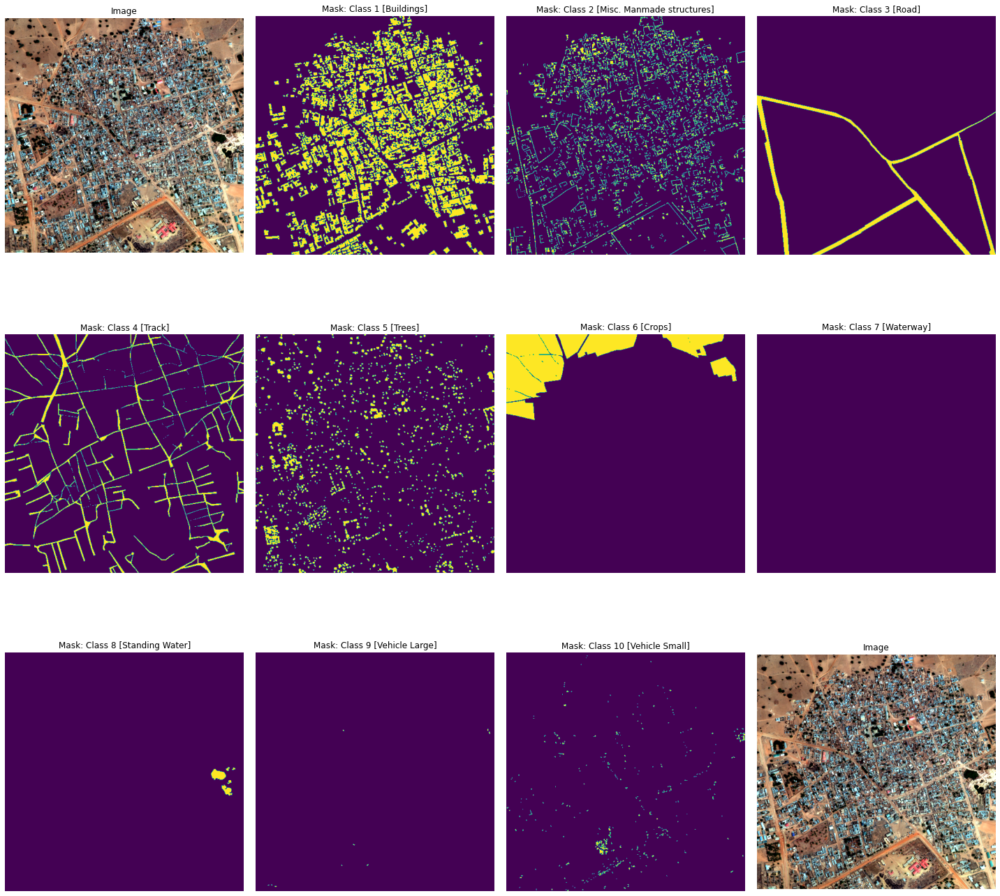

In [26]:
IMAGE_NUM = "6120_2_2" # ID of the Image
df = pd.read_csv('train_wkt_v4.csv') # read the training data from train_wkt_v4.csv
gs = pd.read_csv('grid_sizes.csv', names=['ImageId', 'Xmax', 'Ymin'], skiprows=1) # grid size will also be needed later
#
mask1 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 1, gs, df)
mask2 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 2, gs, df)
mask3 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 3, gs, df)
mask4 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 4, gs, df)
mask5 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 5, gs, df)
mask6 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 6, gs, df)
mask7 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 7, gs, df)
mask8 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 8, gs, df)
mask9 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 9, gs, df)
mask10 = generate_mask_for_image_and_class((IMSIZE, IMSIZE), IMAGE_NUM, 10, gs, df)
#
rgb = tiff.imread(f'three_band/{IMAGE_NUM}.tif')
rgb = np.rollaxis(rgb, 0, 3)
# Plot
fig, axes = plt.subplots(ncols=4, nrows=3, figsize=(20, 20))
ax = axes.ravel()
ax[0].imshow(stretch_n(rgb))
ax[0].set_title('Image')
ax[0].axis('off')
ax[1].imshow(mask1)
ax[1].set_title('Mask: Class 1 [Buildings]')
ax[1].axis('off')
ax[2].imshow(mask2)
ax[2].set_title('Mask: Class 2 [Misc. Manmade structures]')
ax[2].axis('off')
ax[3].imshow(mask3)
ax[3].set_title('Mask: Class 3 [Road]')
ax[3].axis('off')
ax[4].imshow(mask4)
ax[4].set_title('Mask: Class 4 [Track]')
ax[4].axis('off')
ax[5].imshow(mask5)
ax[5].set_title('Mask: Class 5 [Trees]')
ax[5].axis('off')
ax[6].imshow(mask6)
ax[6].set_title('Mask: Class 6 [Crops]')
ax[6].axis('off')
ax[7].imshow(mask7)
ax[7].set_title('Mask: Class 7 [Waterway]')
ax[7].axis('off')
ax[8].imshow(mask8)
ax[8].set_title('Mask: Class 8 [Standing Water]')
ax[8].axis('off')
ax[9].imshow(mask9)
ax[9].set_title('Mask: Class 9 [Vehicle Large]')
ax[9].axis('off')
ax[10].imshow(mask10)
ax[10].set_title('Mask: Class 10 [Vehicle Small]')
ax[10].axis('off')
ax[11].imshow(stretch_n(rgb))
ax[11].set_title('Image')
ax[11].axis('off')
plt.tight_layout()
plt.show()

## Train

Jaccard Coefficient Metrics for Training

In [27]:
# __author__ = Vladimir Iglovikov
# https://www.kaggle.com/resolut/waterway-0-095-lb

def jaccard_coef(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=[0, -1, -2])
    sum_ = K.sum(y_true + y_pred, axis=[0, -1, -2])

    jac = (intersection + smooth) / (sum_ - intersection + smooth)

    return K.mean(jac)


def jaccard_coef_int(y_true, y_pred):
    y_pred_pos = K.round(K.clip(y_pred, 0, 1))

    intersection = K.sum(y_true * y_pred_pos, axis=[0, -1, -2])
    sum_ = K.sum(y_true + y_pred_pos, axis=[0, -1, -2])
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return K.mean(jac)

Image Pre-processing and Stick all Images in a single file for each data uploading while training

In [28]:
# __author__ = "n01z3"
# https://www.kaggle.com/drn01z3/end-to-end-baseline-with-u-net-keras
# Modified and Improved by: Sakib Mahmud

def stick_all_train():
    print ("Stick all Images Together")
    s = IMSIZE

    x = np.zeros((5 * s, 5 * s, Num_Channel))
    y = np.zeros((5 * s, 5 * s, N_Cls))

    ids = sorted(DF.ImageId.unique())
    print (len(ids))
    for i in range(5):
        for j in range(5):
            id = ids[5 * i + j]

            img = combine_image_channels(id)
            img = stretch_n(img)
            print (img.shape, id, np.amax(img), np.amin(img))
            x[s * i:s * i + s, s * j:s * j + s, :] = img[:s, :s, :]
            for z in range(N_Cls):
                y[s * i:s * i + s, s * j:s * j + s, z] = generate_mask_for_image_and_class((img.shape[0], img.shape[1]), id, z + 1)[:s, :s]

    print (np.amax(y), np.amin(y))

    np.save('Data/x_trn_%d' % N_Cls, x) # Create the Data folder beforehand if it gives error
    np.save('Data/y_trn_%d' % N_Cls, y)

Get Smaller Patches from Large Images before Training

In [29]:
# __author__ = "n01z3"
# https://www.kaggle.com/drn01z3/end-to-end-baseline-with-u-net-keras
# Modified and Improved by: Sakib Mahmud

def get_patches(img, msk, amt=10000, aug=True):
    is2 = int(1.0 * ISZ)
    xm, ym = img.shape[0] - is2, img.shape[1] - is2

    x, y = [], []

    tr = [0.4, 0.1, 0.1, 0.15, 0.3, 0.95, 0.1, 0.05, 0.001, 0.005]
    for i in range(amt):
        xc = random.randint(0, xm)
        yc = random.randint(0, ym)

        im = img[xc:xc + is2, yc:yc + is2]
        ms = msk[xc:xc + is2, yc:yc + is2]

        for j in range(N_Cls):
            sm = np.sum(ms[:, :, j])
            if 1.0 * sm / is2 ** 2 > tr[j]:
                if aug:
                    if random.uniform(0, 1) > 0.5:
                        im = im[::-1]
                        ms = ms[::-1]
                    if random.uniform(0, 1) > 0.5:
                        im = im[:, ::-1]
                        ms = ms[:, ::-1]

                x.append(im)
                y.append(ms)

    x, y = 2 * np.transpose(x, (0, 3, 1, 2)) - 1, np.transpose(y, (0, 3, 1, 2))
    x = np.moveaxis(x, 1, 3)
    y = np.moveaxis(y, 1, 3)
    print (x.shape, y.shape, np.amax(x), np.amin(x), np.amax(y), np.amin(y))
    return x, y

Make Validation Set from the Whole Dataset

In [30]:
# __author__ = "n01z3"
# https://www.kaggle.com/drn01z3/end-to-end-baseline-with-u-net-keras

def make_val():
    print ("Create Validation Set")
    img = np.load('Data/x_trn_%d.npy' % N_Cls)
    msk = np.load('Data/y_trn_%d.npy' % N_Cls)
    x, y = get_patches(img, msk, amt=3000)

    np.save('Data/x_val_%d' % N_Cls, x)
    np.save('Data/y_val_%d' % N_Cls, y)

Calculate Jaccard Index

In [33]:
# __author__ = "n01z3"
# https://www.kaggle.com/drn01z3/end-to-end-baseline-with-u-net-keras

def calc_jacc(model):
    img = np.load('Data/x_val_%d.npy' % N_Cls)
    msk = np.load('Data/y_val_%d.npy' % N_Cls)

    prd = model.predict(img, batch_size=4)
    avg, trs = [], []

    for i in range(N_Cls):
        t_msk = msk[:, :, :, i]
        t_prd = prd[:, :, :, i]
        t_msk = t_msk.reshape(msk.shape[0] * msk.shape[1], msk.shape[2])
        t_prd = t_prd.reshape(msk.shape[0] * msk.shape[1], msk.shape[2])

        m, b_tr = 0, 0
        for j in range(10):
            tr = j / 10.0
            pred_binary_mask = t_prd > tr

            jk = jaccard_similarity_score(t_msk, pred_binary_mask)
            if jk > m:
                m = jk
                b_tr = tr
        print(i, m, b_tr)
        avg.append(m)
        trs.append(b_tr)

    score = sum(avg) / 10.0
    return score, trs

Set Configurations

In [31]:
# Configurations
length = ISZ
width = ISZ
model_depth = 4 # Could not go any deeper maintainin reasonable pathc size due to limited RAM
model_width = 64
kernel_size = 3
num_channel = Num_Channel
problem_type = 'Classification'
D_S = 0
A_E = 0
# alpha = 1 # Only applicable for MultiResUNet

Train

In [32]:
def train_net():
    print ("Start Training")
    # Load Training Set
    img = np.load('Data/x_trn_%d.npy' % N_Cls)
    msk = np.load('Data/y_trn_%d.npy' % N_Cls)
    # Load Validation Set
    x_val = np.load('Data/x_val_%d.npy' % N_Cls)
    y_val = np.load('Data/y_val_%d.npy' % N_Cls)
    # Create small patches from large images before training
    x_trn, y_trn = get_patches(img, msk)
    # Declare the Model - Choose from UNet, UNetP, UNetPP, MultiResUNet and Version 2 of each of them
    model = UNet(length, width, model_depth, num_channel, model_width, kernel_size, problem_type='Classification', output_nums=N_Cls, ds=0, ae=0).UNet_v2()
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[jaccard_coef, jaccard_coef_int, 'accuracy', 'mse'])
    # Load pretrained model or weights
    # model.load_weights('results/UNet_5_64.h5')
    # Callbacks - Set EarlyStopping and Checkpoint for Smart Training
    callbacks = [EarlyStopping(monitor='val_loss', patience=15, mode='min'), 
                 ModelCheckpoint('results/UNet_v2_'+str(model_depth)+'_'+str(model_width)+'_'+str(Num_Channel)+'_'+str(N_Cls)+'.h5', 
                                 verbose=1, monitor='val_loss', save_best_only=True, mode='min')]
    # Start Training i.e., Fit the Model
    model.fit(x_trn, y_trn, batch_size=1, epochs=100, verbose=1, shuffle=True, callbacks=callbacks, validation_data=(x_val, y_val))
    # Calculate Jaccard Score
    print ("Per-Class Jaccard Scores")
    score, trs = calc_jacc(model)
    print ('Overall Jaccard Score: ', score)
    
    return Model

## Predict Test Images

In [74]:
# __author__ = Konstantin Lopuhin
# https://www.kaggle.com/lopuhin/dstl-satellite-imagery-feature-detection/full-pipeline-demo-poly-pixels-ml-poly
# Modified and Improved by: Sakib Mahmud

def predict_id(id, model, trs):
    img = combine_image_channels(id)
    x = stretch_n(img)

    cnv = np.zeros((IMSIZE, IMSIZE, Num_Channel)).astype(np.float32)
    prd = np.zeros((IMSIZE, IMSIZE, N_Cls)).astype(np.float32)
    cnv[:img.shape[0], :img.shape[1], :] = x
    div = round(IMSIZE/ISZ)

    for i in range(0, div):
          line = []
          for j in range(0, div):
              line.append(cnv[i * ISZ:(i + 1) * ISZ, j * ISZ:(j + 1) * ISZ])
          x = 2 * np.transpose(line, (0, 3, 1, 2)) - 1
          x = np.moveaxis(x, 1, 3)
          tmp = model.predict(x, batch_size=4)
          for j in range(tmp.shape[0]):
              prd[i * ISZ:(i + 1) * ISZ, j * ISZ:(j + 1) * ISZ, :] = tmp[j]
          
          trs = [0.4, 0.1, 0.4, 0.3, 0.3, 0.5, 0.3, 0.6, 0.1, 0.1]
          for i in range(N_Cls):
              prd[i] = prd[i] > trs[i]

    return prd[:, :img.shape[0], :img.shape[1]]

def predict_test(model, trs = [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]):
    print ("Predict Test")
    for i, id in enumerate(sorted(set(SB['ImageId'].tolist()))):
        msk = predict_id(id, model, trs)
        np.save('pred_masks/msk%s' % id, msk)
        if i % 100 == 0: 
          print (i, id)

def mask_for_polygons(polygons, im_size):
    img_mask = np.zeros(im_size, np.uint8)

    if not polygons:
        return img_mask
    int_coords = lambda x: np.array(x).round().astype(np.int32)
    exteriors = [int_coords(poly.exterior.coords) for poly in polygons]
    interiors = [int_coords(pi.coords) for poly in polygons
                 for pi in poly.interiors]

    cv2.fillPoly(img_mask, exteriors, 1)
    cv2.fillPoly(img_mask, interiors, 0)
    return img_mask, polygons

def mask_to_polygons(mask, epsilon=1, min_area=1.):
    # first, find contours with cv2: it's much faster than shapely
    contours, hierarchy = cv2.findContours(
        ((mask == 1) * 255).astype(np.uint8),
        cv2.RETR_CCOMP, cv2.CHAIN_APPROX_TC89_KCOS)
    # create approximate contours to have reasonable submission size
    approx_contours = [cv2.approxPolyDP(cnt, epsilon, True)
                       for cnt in contours]
    if not contours:
        return MultiPolygon()
    # now messy stuff to associate parent and child contours
    cnt_children = defaultdict(list)
    child_contours = set()
    assert hierarchy.shape[0] == 1
    # http://docs.opencv.org/3.1.0/d9/d8b/tutorial_py_contours_hierarchy.html
    for idx, (_, _, _, parent_idx) in enumerate(hierarchy[0]):
        if parent_idx != -1:
            child_contours.add(idx)
            cnt_children[parent_idx].append(approx_contours[idx])
    # create actual polygons filtering by area (removes artifacts)
    all_polygons = []
    for idx, cnt in enumerate(approx_contours):
        if idx not in child_contours and cv2.contourArea(cnt) >= min_area:
            assert cnt.shape[1] == 1
            poly = Polygon(
                shell=cnt[:, 0, :],
                holes=[c[:, 0, :] for c in cnt_children.get(idx, [])
                       if cv2.contourArea(c) >= min_area])
            all_polygons.append(poly)
    # approximating polygons might have created invalid ones, fix them
    all_polygons = MultiPolygon(all_polygons)
    if not all_polygons.is_valid:
        all_polygons = all_polygons.buffer(0)
        # Sometimes buffer() converts a simple Multipolygon to just a Polygon,
        # need to keep it a Multi throughout
        if all_polygons.type == 'Polygon':
            all_polygons = MultiPolygon([all_polygons])
    return all_polygons

Get Threshold Values per class.   
Thresholding Values Per Class [Lower - Upper]:  
Class 0: [0.30 - 1.00]  
Class 1: [0.15 - 1.00]  
Class 2: [0.10 - 1.00]  
Class 3: [0.15 - 1.00]  
Class 4: [0.30 - 1.00]  
Class 5: [0.50 - 1.00]  
Class 6: [0.10 - 1.00]  
Class 7: [0.03 - 1.00]  
Class 8: [0.10 - 1.00]  
Class 9: [0.10 - 1.00] 

In [69]:
def get_thresh(msk, target_class):
    Lower_Thresh = [0.30, 0.15, 0.10, 0.15, 0.20, 0.45, 0.10, 0.03, 0.10, 0.10]
    class_des_array = ['Buildings', 'Misc. Manmade Structures', 'Road', 'Track', 
                       'Trees', 'Crops', 'Waterway', 'Standing Water', 'Vehicle Large', 'Vehicle Small']
    Lower_Thresh = Lower_Thresh[target_class]
    Upper_Thresh = 1
    ret, thresh = cv2.threshold(msk,Lower_Thresh,Upper_Thresh,cv2.THRESH_BINARY)
    count = cv2.countNonZero(thresh)
    height = msk.shape[0]
    width = msk.shape[1]
    area = count*1*1/(width*height)
    percent = (area/(1*1))*100
    print(f'Pixels Crossing the Threshold for Class {target_class} [{class_des_array[target_class]}] = {count}')
    print(f'Covered Area by Class {target_class} = {area:.3} sq.km')
    print(f'Percent Covered by Class {target_class} = {percent:.3}%')

    return thresh

Check and Plot Predicted Masks

In [61]:
def check_predict(target_class, id, image_channel):
    class_des_array = ['Buildings', 'Misc. Manmade Structures', 'Road', 'Track', 
                       'Trees', 'Crops', 'Waterway', 'Standing Water', 'Vehicle Large', 'Vehicle Small']
    msk = predict_id(id, model, trs)
    img = combine_image_channels(id)
    msk = msk[:,:,target_class]
    #
    thresh = get_thresh(msk, target_class)
    #
    polymask, polygons = mask_for_polygons(mask_to_polygons(thresh, epsilon=1), img.shape[:2])
    #
    fig, axes = plt.subplots(ncols=4, nrows=1, figsize=(30, 30))
    ax = axes.ravel()
    ax[0].imshow(stretch_n(img)[:,:,image_channel])
    ax[0].set_title(str('Image ID: ' + id))
    ax[1].imshow(msk, cmap=plt.get_cmap('gray'))
    ax[1].set_title('Predicted Pixels - Class: ' + str(target_class) + ' [' + class_des_array[target_class] + ']')
    ax[2].imshow(thresh, cmap=plt.get_cmap('gray'))
    ax[2].set_title('Predicted Pixels after thresholding')
    ax[3].imshow(polymask, cmap=plt.get_cmap('gray'))
    ax[3].set_title('Predicted Polygones')
    plt.tight_layout()
    plt.show()

# Main

Stick all images for training

In [ ]:
stick_all_train()

Make Validation Set

In [ ]:
make_val()

Create, Train and Evaluate Model

In [ ]:
model = train_net()

Predict Test Images and Save 

(Caution: This will save all resulting masks into the directory!)

In [ ]:
predict_test(model, trs)

Import Trained Model for Testing

In [39]:
# Configurations
length = ISZ
width = ISZ
model_depth = 4 # Could not go any deeper maintainin reasonable pathc size due to limited RAM
model_width = 64
kernel_size = 3
num_channel = Num_Channel
problem_type = 'Classification'
D_S = 0
A_E = 0
# alpha = 1 # Only applicable for MultiResUNet

In [40]:
model = UNet(length, width, model_depth, num_channel, model_width, kernel_size, problem_type='Classification', output_nums=N_Cls, ds=0, ae=0).UNet_v2()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[jaccard_coef, jaccard_coef_int, 'accuracy'])
# Load pretrained model or weights
model.load_weights('results/UNet_v2_'+str(model_depth)+'_'+str(model_width)+'_'+str(Num_Channel)+'_'+str(N_Cls)+'.h5')

## Display Predicted Images with Respective Masks and Polygons

'''
DSTL has labeled 10 different classes:
0. *Buildings - large building, residential, non-residential, fuel storage facility, fortified building
1. *Misc. Manmade structures 
2. **Road
3. **Track - poor/dirt/cart track, footpath/trail
4. ***Trees - woodland, hedgerows, groups of trees, standalone trees
5. ***Crops - contour ploughing/cropland, grain (wheat) crops, row (potatoes, turnips) crops
6. ****Waterway
7. ****Standing water
8. Vehicle Large - large vehicle (e.g. lorry, truck,bus), logistics vehicle
9. Vehicle Small - small vehicle (car, van), motorbike
''' 

Let's test for a town containing building, roads, tracks (smaller roads, trails or footpaths, etc.), trees, crops (or fields), etc.

Pixels Crossing the Threshold for Class 0 [Buildings] = 75829
Covered Area by Class 0 = 0.289 sq.km
Percent Covered by Class 0 = 28.9%


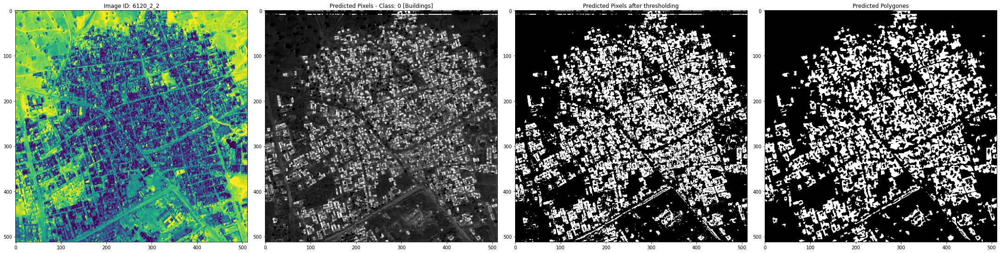

Pixels Crossing the Threshold for Class 1 [Misc. Manmade Structures] = 26143
Covered Area by Class 1 = 0.0997 sq.km
Percent Covered by Class 1 = 9.97%


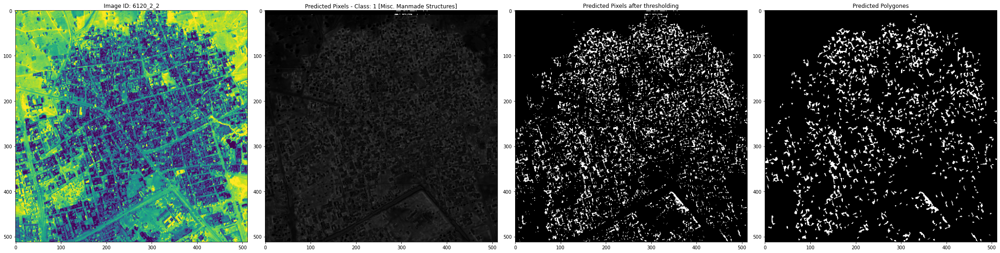

Pixels Crossing the Threshold for Class 2 [Road] = 17149
Covered Area by Class 2 = 0.0654 sq.km
Percent Covered by Class 2 = 6.54%


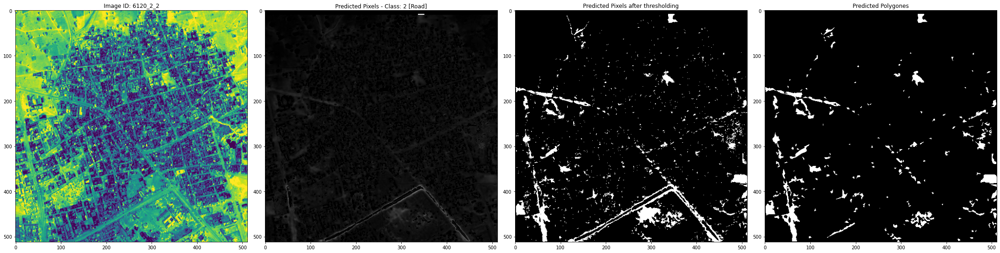

Pixels Crossing the Threshold for Class 3 [Track] = 29419
Covered Area by Class 3 = 0.112 sq.km
Percent Covered by Class 3 = 11.2%


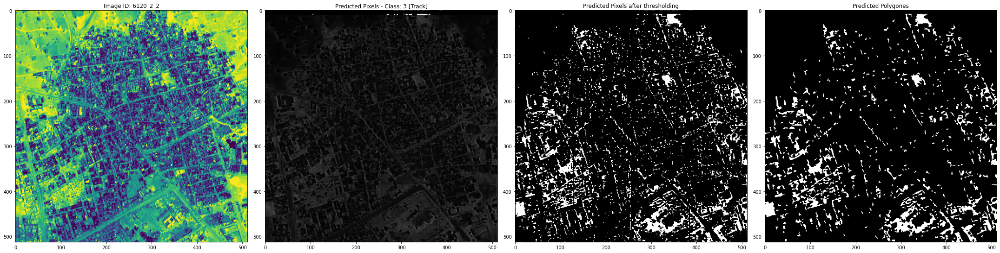

Pixels Crossing the Threshold for Class 4 [Trees] = 52645
Covered Area by Class 4 = 0.201 sq.km
Percent Covered by Class 4 = 20.1%


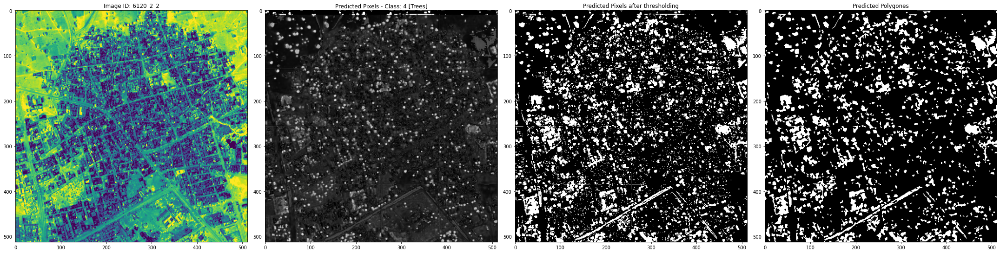

Pixels Crossing the Threshold for Class 5 [Crops] = 37954
Covered Area by Class 5 = 0.145 sq.km
Percent Covered by Class 5 = 14.5%


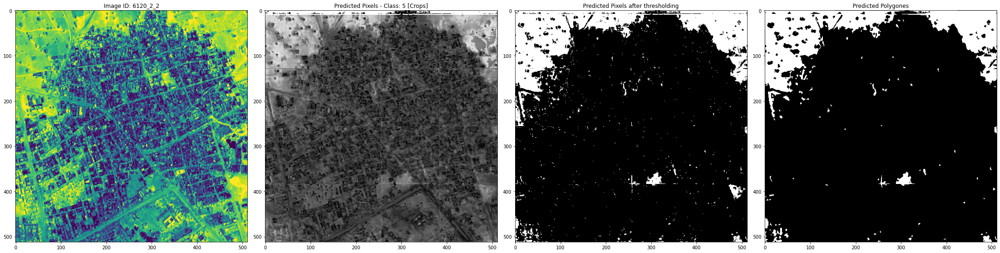

In [70]:
# Input Class Number and Image ID to Visualize
# img_id = '6120_2_3', '6080_1_1, '6080_4_3', '6120_2_2', '6150_3_4', '6080_1_3'
trs = [0.9, 0.3, 0.3, 0.3, 0.1, 0.1, 0.5, 0.1, 0.1, 0.1]
im_channel = 7
img_id = "6120_2_2"
#
class_num = 0
check_predict(class_num, img_id, im_channel)
class_num = 1
check_predict(class_num, img_id, im_channel)
class_num = 2
check_predict(class_num, img_id, im_channel)
class_num = 3
check_predict(class_num, img_id, im_channel)
class_num = 4
check_predict(class_num, img_id, im_channel)
class_num = 5
check_predict(class_num, img_id, im_channel)
# Class 8 and 9 (Detecting Vehicles) are not of important for this task.

Then let's test for a forest area containing rivers (moving water), standing water (e.g., ponds), many trees, crops, etc.

Pixels Crossing the Threshold for Class 4 [Trees] = 102494
Covered Area by Class 4 = 0.391 sq.km
Percent Covered by Class 4 = 39.1%


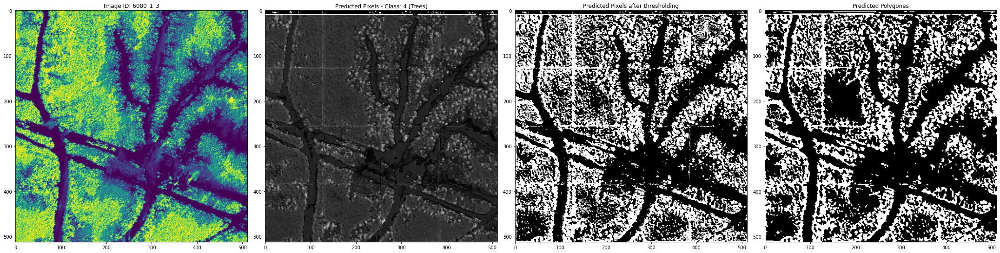

Pixels Crossing the Threshold for Class 5 [Crops] = 8235
Covered Area by Class 5 = 0.0314 sq.km
Percent Covered by Class 5 = 3.14%


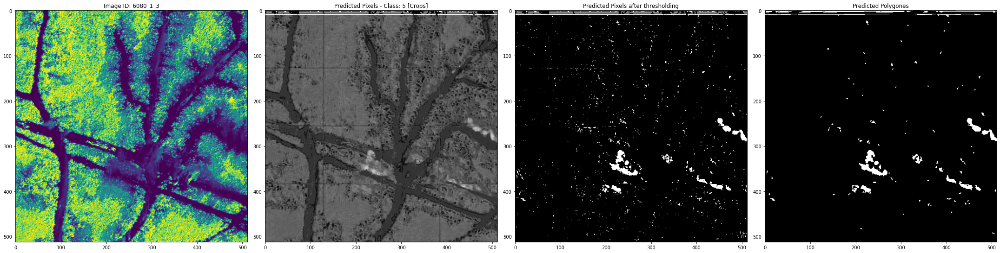

Pixels Crossing the Threshold for Class 6 [Waterway] = 47140
Covered Area by Class 6 = 0.18 sq.km
Percent Covered by Class 6 = 18.0%


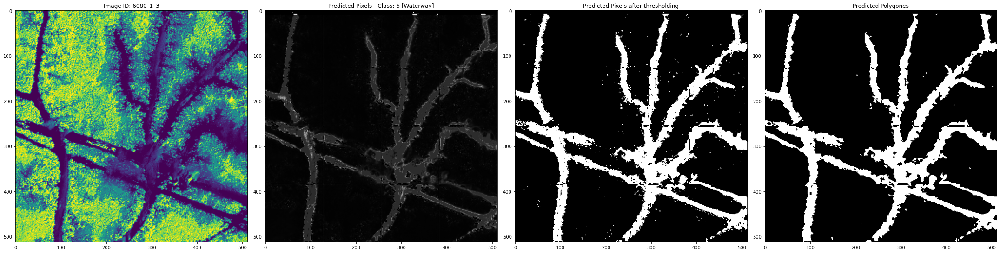

Pixels Crossing the Threshold for Class 7 [Standing Water] = 50426
Covered Area by Class 7 = 0.192 sq.km
Percent Covered by Class 7 = 19.2%


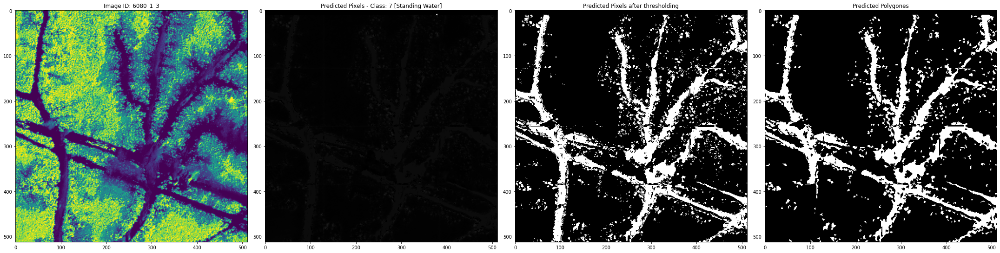

In [71]:
# img_id = '6120_2_3', '6080_1_1, '6080_4_3', '6120_2_2', '6150_3_4', '6080_1_3'
img_id = "6080_1_3"
#
class_num = 4
check_predict(class_num, img_id, im_channel)
class_num = 5
check_predict(class_num, img_id, im_channel)
class_num = 6
check_predict(class_num, img_id, im_channel)
class_num = 7
check_predict(class_num, img_id, im_channel)
# Class 8 and 9 (Detecting Vehicles) are not of important for this task.

# Evaluate External Data: Test Sentinel-2 Images using the Trained Model

## Import, Prepare and Test Sentinel-2 Satellite Dataset

In [ ]:
def get_Sent2():
  sentinel2_img = np.zeros(shape=(512,512,8), dtype=float)
  for i in range(1,9):
    filename_Sent = os.path.join('Sentinel2', f'B0{i}.tif')
    img_S = tiff.imread(filename_Sent)
    img_S_resize = cv2.resize(img_S, (IMSIZE, IMSIZE)) 
    sentinel2_img[:,:,i-1]=img_S_resize
  
  return sentinel2_img


def predict_id(img, model, trs):
    x = stretch_n(img)

    cnv = np.zeros((IMSIZE, IMSIZE, Num_Channel)).astype(np.float32)
    prd = np.zeros((IMSIZE, IMSIZE, N_Cls)).astype(np.float32)
    cnv[:img.shape[0], :img.shape[1], :] = x
    div = round(IMSIZE/ISZ)

    for i in range(0, div):
          line = []
          for j in range(0, div):
              line.append(cnv[i * ISZ:(i + 1) * ISZ, j * ISZ:(j + 1) * ISZ])
          x = 2 * np.transpose(line, (0, 3, 1, 2)) - 1
          x = np.moveaxis(x, 1, 3)
          tmp = model.predict(x, batch_size=4)
          for j in range(tmp.shape[0]):
              prd[i * ISZ:(i + 1) * ISZ, j * ISZ:(j + 1) * ISZ, :] = tmp[j]
          
          trs = [0.4, 0.1, 0.4, 0.3, 0.3, 0.5, 0.3, 0.6, 0.1, 0.1]
          for i in range(N_Cls):
              prd[i] = prd[i] > trs[i]

    return prd[:, :img.shape[0], :img.shape[1]]


def predict_test(model, trs = [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]):
    print ("Predict Test")
    for i, id in enumerate(sorted(set(SB['ImageId'].tolist()))):
        msk = predict_id(model, trs)
        np.save('pred_masks/msk%s' % id, msk)
        if i % 100 == 0: 
          print (i, id)

In [ ]:
def check_predict(target_class, image_channel):
    img = get_Sent2()
    msk = predict_id(img, model, trs)
    msk = msk[:,:,target_class]
    #
    thresh = get_thresh(msk, target_class)
    #
    polymask, polygons = mask_for_polygons(mask_to_polygons(thresh, epsilon=1), img.shape[:2])
    #
    fig, axes = plt.subplots(ncols=4, nrows=1, figsize=(30, 30))
    ax = axes.ravel()
    ax[0].imshow(stretch_n(img)[:,:,image_channel])
    ax[0].set_title(str('Image ID:'))
    ax[1].imshow(msk, cmap=plt.get_cmap('gray'))
    ax[1].set_title('Predicted Pixels')
    ax[2].imshow(thresh, cmap=plt.get_cmap('gray'))
    ax[2].set_title('Predicted Pixels after thresholding')
    ax[3].imshow(polymask, cmap=plt.get_cmap('gray'))
    ax[3].set_title('Predicted Polygones')
    plt.tight_layout()
    plt.show()

Pixels Crossing the Threshold for Class 7 = 140625
Covered Area by Class 7 = 0.536 sq.km
Percent Covered by Class 7 = 53.6%


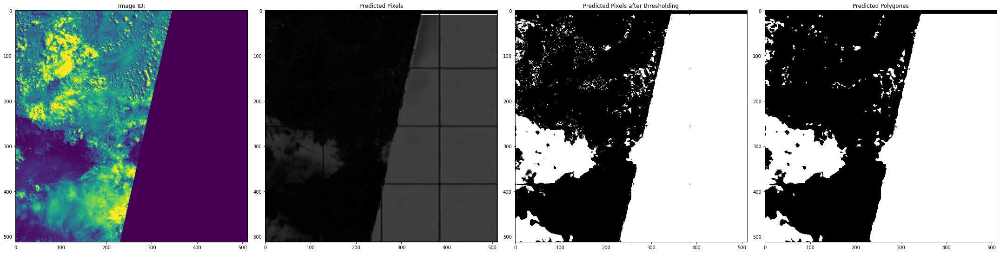

In [ ]:
# Input Class Number and Image ID to Visualize
# img_id = '6120_2_3', '6080_1_1, '6080_4_3', '6120_2_2', '6150_3_4', '6080_1_3'
trs = [0.9, 0.3, 0.3, 0.3, 0.1, 0.1, 0.5, 0.1, 0.1, 0.1]
class_num = 7
im_channel = 7
check_predict(class_num, im_channel)

## Save Labels

This code can be used to Save Labels for new Images and expand the training dataset to cover more and more types of images (within these 10 classes) and from various global regions.

In [ ]:
img_id = "6120_2_2"
for i in range(N_Cls-2):
  save_labels(img_id, model, trs, i)

Save Labels in a CSV or Spreadsheet File

In [73]:
def save_labels(image_id, model, trs, target_class):
  msk = predict_id(image_id, model, trs)
  img = combine_image_channels(image_id)
  msk = msk[:,:,target_class]
  thresh = get_thresh(msk, target_class)
  polymask, multi_polygons = mask_for_polygons(mask_to_polygons(thresh, epsilon=1), img.shape[:2])
  print(multi_polygons)
  print('-------------------------------------------------------------------')
  string_poly = str(multi_polygons)
  # Save the Multipolygon in a Text or CSV file for Semi-supervised learning
  d = {'Image_ID': [image_id], 'Class': [target_class], 'MultiPolygons': string_poly}
  df = pd.DataFrame(data=d)
  if target_class == 0:
      df.to_csv("Labels.csv")
  if target_class != 0:
      df.to_csv("Labels.csv", header=None, mode="a")

Note: This step should be further improved since the saved values are just image cooridnates, not global coordinates like the original labels of DSTL dataset. 